# This is a pipeline to visualize and analyze the results of CellProfiler on inmunohistochemistry experiments done for PH3


#### TODO:
    - register an a2axai14 line to ARA to separate territories in the ToS
    - identify the ph3 positive cells with ilastik
    - criteria are very stringent for d1 vs d2. Maybe I need to select them by hand

In [1]:
# Import stuff
%load_ext autoreload
%autoreload 2
import os
from utils import data_reader
from utils import plot_utils
from utils import generic_functions as gf
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageOps
import numpy as np
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
#from ggplot import *
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import random

In [2]:
# Indicate the animal ID you want to load
animal_to_load = 'PH301'
# Indicate the main path where all processed data is
processed_data_path = '/mnt/c/Users/herny/Desktop/SWC/Data/Microscopy_Data/Plasticity/PH3_inmuno/Processed_data/'

In [3]:
# get paths
data_path = os.path.join(processed_data_path, animal_to_load)
# path where the dataframe is (the output of CellProfiler)
CPoutput_path = os.path.join(data_path, 'Cell_profiler_output/')

In [4]:
# Import the data
df = data_reader.PH3_data_reader(CPoutput_path)

In [5]:
# Create a unique identifier for every instance of measure (manual ROI)
df['group_name'] = df.apply(gf.group_name, axis=1)
df['manual_roi_name'] = df.apply(gf.manual_roi_name, axis=1)

In [6]:
# Add the data path as an attribute of the dataframe
df.attrs['datapath'] = data_path

In [7]:
# Rename channels
#df = df.rename(columns={"Children_FinalDots_C2_Count": "drd2_count",
#                        "Children_FinalDots_C3_Count": "drd1_count"})

In [8]:
#OPTIONAL

# Remove some manual ROIs that are not good
g_names_to_remove = ['PH301-1-5-R-Tail']

df = df[~df.manual_roi_name.isin(g_names_to_remove)]

In [9]:
df

,AnimalID,ExperimentalCondition,Slide,Slice,Side,AP,ROI,ObjectNumber_cells,I_cell_C2,I_cell_C3,I_cell_C4,ObjectNumber_surround,I_surround_C2,I_surround_C3,I_surround_C4,Center_X,Center_Y,PathName_Channel1,group_name,manual_roi_name
0,PH301,A2A-Ai14,1,0,L,Tail,10,1,0.366423,0.741471,0.410246,1,0.348954,0.645080,0.375806,275.346444,30.894319,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-10,PH301-1-0-L-Tail
1,PH301,A2A-Ai14,1,0,L,Tail,10,2,0.496756,0.395708,0.377823,2,0.425724,0.467022,0.382324,330.336699,29.484099,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-10,PH301-1-0-L-Tail
2,PH301,A2A-Ai14,1,0,L,Tail,10,3,0.200450,0.226149,0.383472,3,0.285170,0.267902,0.348043,1438.401119,31.073694,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-10,PH301-1-0-L-Tail
3,PH301,A2A-Ai14,1,0,L,Tail,10,4,0.251851,0.372683,0.402086,4,0.330819,0.471678,0.387068,107.715245,37.061786,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-10,PH301-1-0-L-Tail
4,PH301,A2A-Ai14,1,0,L,Tail,10,5,0.131755,0.067565,0.229131,5,0.152858,0.081000,0.217947,1787.288373,51.762645,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-10,PH301-1-0-L-Tail
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46050,PH301,A2A-Ai14,1,5,L,Tail,9,395,0.452199,0.325409,0.610825,395,0.447620,0.175759,0.612102,2180.499174,2241.942149,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-5-L-Tail-9,PH301-1-5-L-Tail
46051,PH301,A2A-Ai14,1,5,L,Tail,9,396,0.545626,0.920519,0.545991,396,0.573240,0.792769,0.521804,61.849852,2255.700444,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-5-L-Tail-9,PH301-1-5-L-Tail
46052,PH301,A2A-Ai14,1,5,L,Tail,9,397,0.587034,0.633703,0.505176,397,0.583434,0.742719,0.515821,215.884983,2253.901042,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-5-L-Tail-9,PH301-1-5-L-Tail
46053,PH301,A2A-Ai14,1,5,L,Tail,9,398,0.525303,0.414840,0.444026,398,0.603575,0.503987,0.484984,842.402836,2247.950236,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-5-L-Tail-9,PH301-1-5-L-Tail


***
### Sanity checks on the data
***

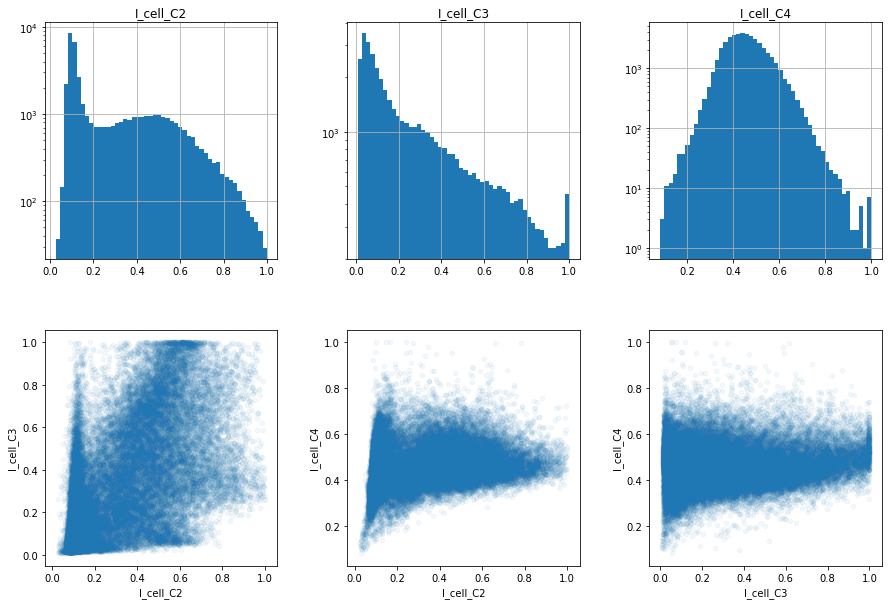

In [10]:
# plot histograms of counts for all the cells
channels = ["I_cell_C2", "I_cell_C3", "I_cell_C4"]
%matplotlib inline
fig, axs = plt.subplots(2, ncols=3, sharey=False, figsize=(15,10))
axs = axs.ravel()
axArr = [axs[0], axs[1], axs[2]]
i = 0
for axis in axArr:
    df.hist(channels[i], ax = axis, bins=50)
    #sns.distplot(df[channels[i]], ax = axis)
    axis.set_yscale("log")
    #axis.set_ylim(0,1000)
    axis.set_title(channels[i])
    i+=1
df.plot.scatter(channels[0], channels[1], ax = axs[3], alpha = 0.05)
df.plot.scatter(channels[0], channels[2], ax = axs[4], alpha = 0.05)
df.plot.scatter(channels[1], channels[2], ax = axs[5], alpha = 0.05)
plt.show()

#### Steps:
- Identify PH3 positive cells
- Select SPNs
    - Select D1, and select D2

Outputs:
- Quantify the proportion of PH3+ D1 and D2
- Locations of PH3 cells with three categories: D1, D2, uncategorized

### - Identify PH3+ cells

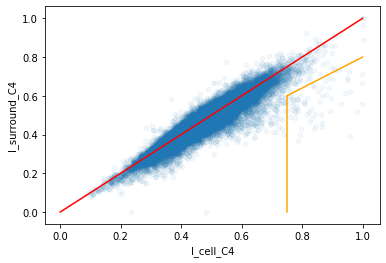

In [11]:
# define parameters for selection of ph3 cells
c4_thr = 0.75
c4_dif = 0.8
xs = np.linspace(c4_thr, 1, 100)

df.plot.scatter("I_cell_C4", "I_surround_C4", alpha = 0.05)
plt.plot([0, 1], [0, 1], '-r')
plt.plot([c4_thr, c4_thr], [0, c4_thr * c4_dif], '-', color='orange')
plt.plot(xs, xs * c4_dif, '-', color='orange')
plt.show()

In [12]:
# apply the selection
# find indexes of PH3 cells
PH3_indexes = df[np.logical_and(df.I_cell_C4 >= c4_thr, (df.I_cell_C4 * c4_dif) >= df.I_surround_C4)].index.values

In [13]:
df.loc[PH3_indexes].shape

(63, 20)

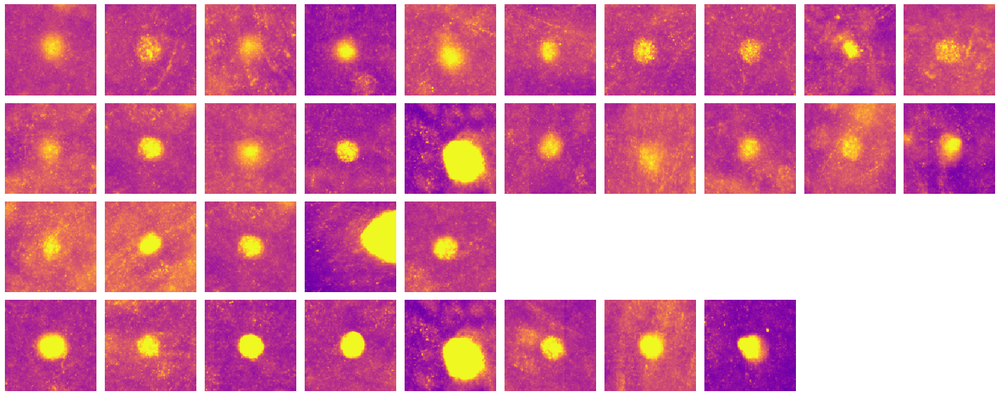

In [81]:
# plot just one channel
channel = 4
ncells = 10
sc = 'I_cell_C' + str(channel)
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((.75, .8), (.8, 9), (.9, .95), (.95, 1))
# get indexes to plot
indexes = gf.get_indexes_by_thr(df.loc[PH3_indexes], sc, thresholds, ncells)
# plot
fig, axs = plt.subplots(len(thresholds), ncells, sharey=False, figsize=(np.ceil(2*ncells), np.ceil(2*len(thresholds))))
fig = plot_utils.plot_channel_of_indexes(fig, axs, indexes, df, channel, window=130, lut='plasma')
fig.show()

In [15]:
df.loc[PH3_indexes].manual_roi_name.unique()

array(['PH301-1-0-L-Tail', 'PH301-1-0-R-Tail', 'PH301-1-2-L-Tail',
       'PH301-1-2-R-Tail', 'PH301-1-3-L-Tail', 'PH301-1-3-R-Tail',
       'PH301-1-5-L-Tail'], dtype=object)

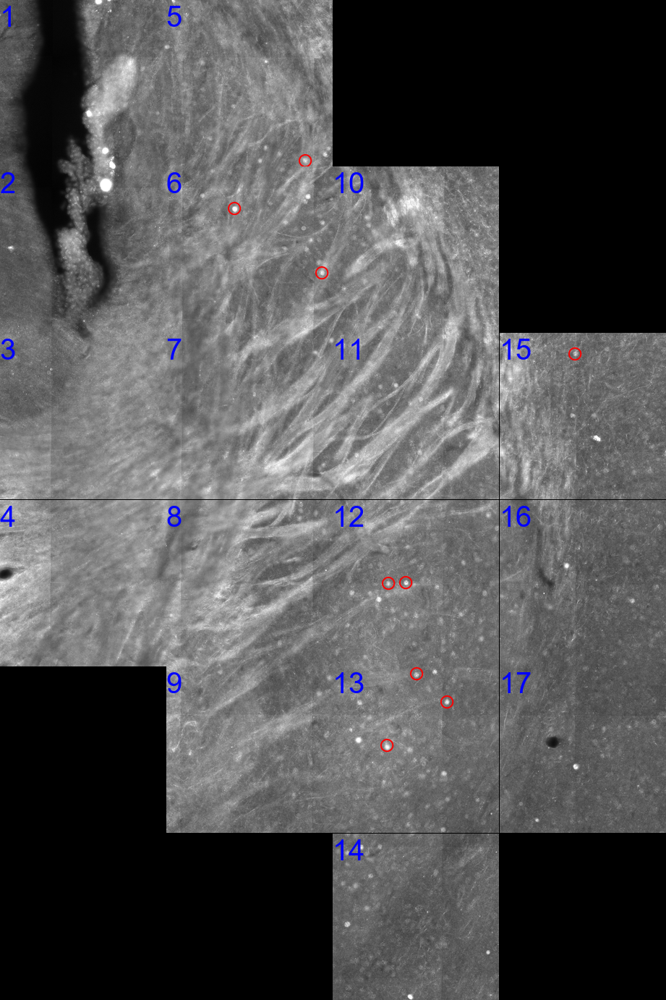

In [16]:
# Concatenate all the ROIs from one manual slice and show the identified cells

# set the conditions to get the data of one of the ROIs
sel_animal = 'PH301'
sel_slide = '1'
sel_slice = '2'
sel_side = 'R'
sel_ap = 'Tail'

sel_mroi_name = '-'.join([sel_animal, sel_slide, sel_slice, sel_side, sel_ap])

# regenerate the picture from the square ROIs
im = plot_utils.get_concat_image_from_rois(df_raw=df, indexes_to_plot=PH3_indexes, sel_mroi_name=sel_mroi_name,
                                           channel=4, cir_radius=80, binning=10, tdtomato_thr=-1)
im

### - Select SPNs, being very stringent

In [26]:
# select a criteria for what is an SPN
c2_thr = .7
# find indexes of those cells
SPN_indexes = df[df.I_cell_C2 >= c2_thr].index.values
df.loc[SPN_indexes].shape

(2594, 20)

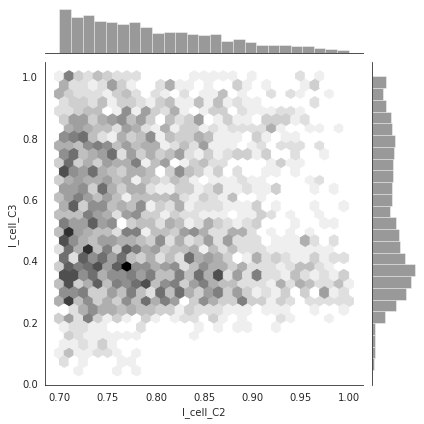

In [25]:
# plot the distribution to select a threshold for which ones are d1 and which ones d2
%matplotlib inline
pal = sns.cubehelix_palette(light=1, as_cmap=True)
with sns.axes_style("white"):
    sns.jointplot(x='I_cell_C2',
                  y='I_cell_C3',
                  data=df.loc[SPN_indexes],
                  kind="hex",
                  #bins='log',
                  # cmap=pal,
                  joint_kws=dict(gridsize=30),
                  color='k',
                  ratio=6,
                  marginal_kws=dict(bins=25, rug=False))


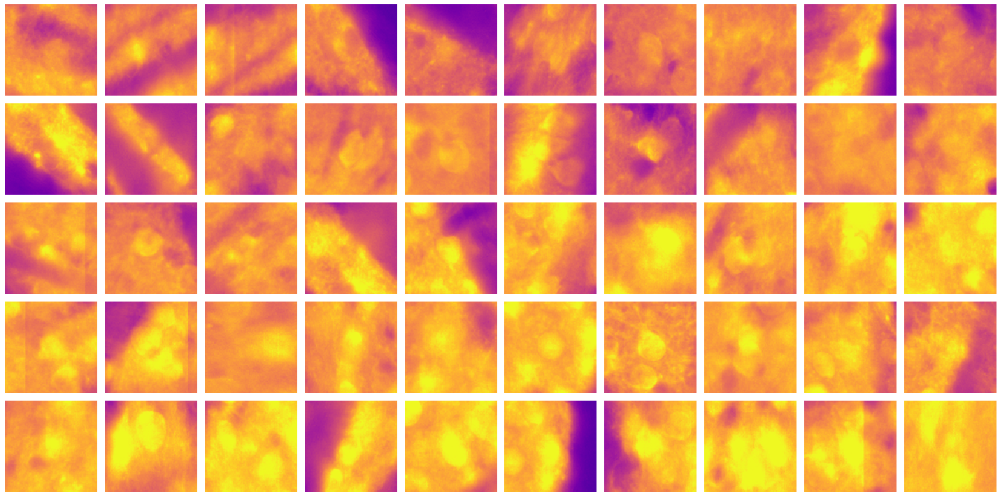

In [31]:
# plot just one channel
channel = 2
ncells = 10
sc = 'I_cell_C' + str(channel)
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((.7, .75), (.75, .8), (.8, 9), (.9, .95), (.95, 1))
# get indexes to plot
indexes = gf.get_indexes_by_thr(df.loc[SPN_indexes], sc, thresholds, ncells)
# plot
fig, axs = plt.subplots(len(thresholds), ncells, sharey=False, figsize=(np.ceil(2*ncells), np.ceil(2*len(thresholds))))
fig = plot_utils.plot_channel_of_indexes(fig, axs, indexes, df, channel, window=130, lut='plasma')
fig.show()

### - Select d1 and d2 separately

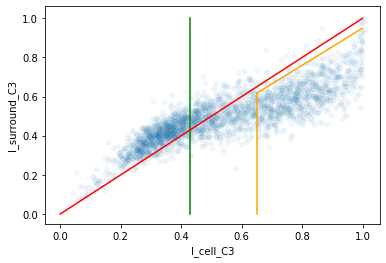

44.373333333333335

In [78]:
# define parameters for selection of d2 cells
c3_thr_for_d1 = 0.43
c3_thr_for_d2 = 0.65
c3_dif_for_d2 = 0.95
xs = np.linspace(c3_thr_for_d2, 1, 100)


df.loc[SPN_indexes].plot.scatter("I_cell_C3", "I_surround_C3", alpha = 0.05)
plt.plot([c3_thr_for_d1, c3_thr_for_d1], [0, 1], '-', color='green')
plt.plot([c3_thr_for_d2, c3_thr_for_d2], [0, c3_thr_for_d2 * c3_dif_for_d2], '-', color='orange')
plt.plot(xs, xs * c3_dif_for_d2, '-', color='orange')
plt.plot([0, 1], [0, 1], '-r')
plt.show()

# find their indexes
d1_indexes = df[df.I_cell_C3 <= c3_thr_for_d1].index.values
d2_indexes = df[np.logical_and(df.I_cell_C3 >= c3_thr_for_d2,
                               (df.I_cell_C3 * c3_dif_for_d2) >= df.I_surround_C3)].index.values

# combine them with the SPNs
d1_SPN_indexes = np.intersect1d(SPN_indexes, d1_indexes)
d2_SPN_indexes = np.intersect1d(SPN_indexes, d2_indexes)

# percentage of d2 cells
d2_num = len(d2_SPN_indexes)
d1_num = len(d1_SPN_indexes)
100 * d2_num / (d1_num + d2_num)

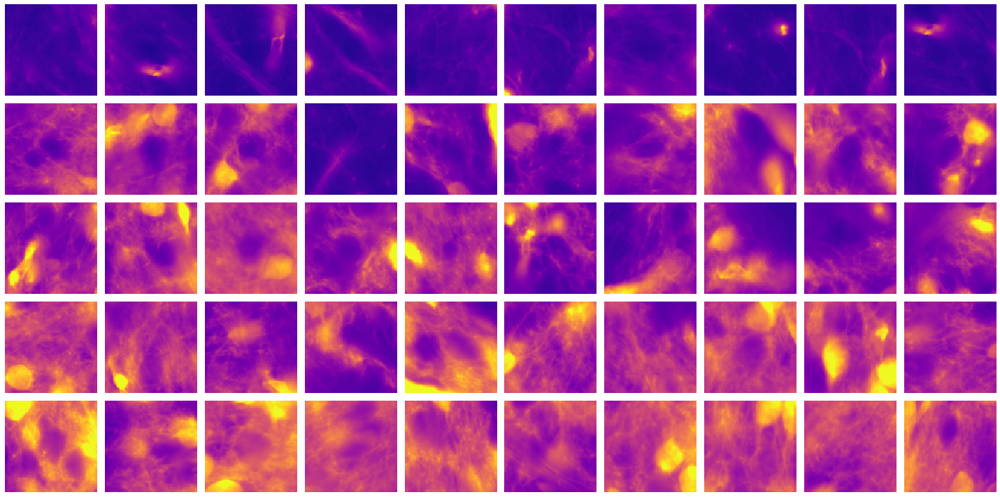

In [68]:
# see the d1 cells
channel = 3
ncells = 10
sc = 'I_cell_C' + str(channel)
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((0, .1), (.1, .2), (.2, .3), (.3, .4), (.4, .5))
# get indexes to plot
indexes = gf.get_indexes_by_thr(df.loc[d1_SPN_indexes], sc, thresholds, ncells)
# plot
fig, axs = plt.subplots(len(thresholds), ncells, sharey=False, figsize=(np.ceil(2*ncells), np.ceil(2*len(thresholds))))
fig = plot_utils.plot_channel_of_indexes(fig, axs, indexes, df, channel, window=130, lut='plasma')
fig.show()

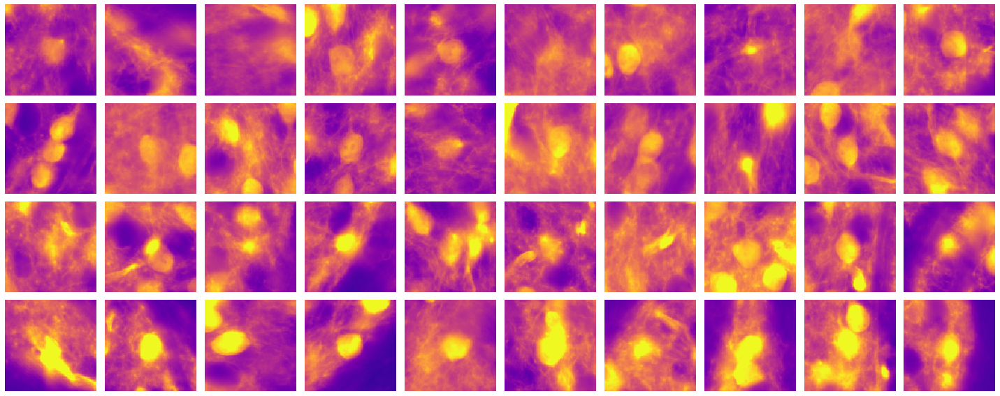

In [79]:
# see the d2 cells
channel = 3
ncells = 10
sc = 'I_cell_C' + str(channel)
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((.65, .7), (.7, .8), (.8, .9), (.9, 1))
# get indexes to plot
indexes = gf.get_indexes_by_thr(df.loc[d2_SPN_indexes], sc, thresholds, ncells)
# plot
fig, axs = plt.subplots(len(thresholds), ncells, sharey=False, figsize=(np.ceil(2*ncells), np.ceil(2*len(thresholds))))
fig = plot_utils.plot_channel_of_indexes(fig, axs, indexes, df, channel, window=130, lut='plasma')
fig.show()

In [80]:
# total number of PH3 cells
print("There are {} PH3+ cells".format(len(PH3_indexes)))
# total number of d1+ PH3 cells
d1_SPN_PH3_indexes = np.intersect1d(PH3_indexes, d1_SPN_indexes)
print("There are {} d1 + cells".format(len(d1_SPN_PH3_indexes)))
# total number of d2+ PH3 cells
d2_SPN_PH3_indexes = np.intersect1d(PH3_indexes, d2_SPN_indexes)
print("There are {} d2 + cells".format(len(d2_SPN_PH3_indexes)))

# TODO: show enrichment. Normalize by total number of cells selected

There are 63 PH3+ cells
There are 5 d1 + cells
There are 0 d2 + cells


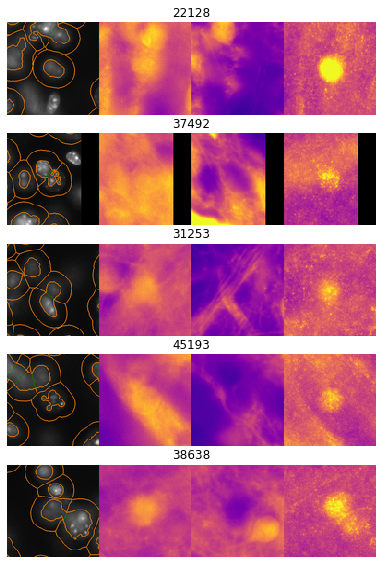

In [75]:
# plot some of the d1 cells
ncells = 10
shuffledIdx = df.loc[d1_SPN_PH3_indexes].index.values.copy()
# shuffle them
np.random.shuffle(shuffledIdx)
shuffledIdx = shuffledIdx[0:ncells]
fig = plt.subplots(sharey=False, figsize=(15,np.ceil(2*ncells)))
for counter, i in enumerate(shuffledIdx):
    CellImage = plot_utils.plotPH3Cell(df.loc[i], df.attrs['datapath'], window=130, lut='plasma')
    plt.subplot(ncells, 1, counter+1)
    plt.grid(False)
    plt.axis('off')
    plt.title(str(i))
    plt.imshow(CellImage)

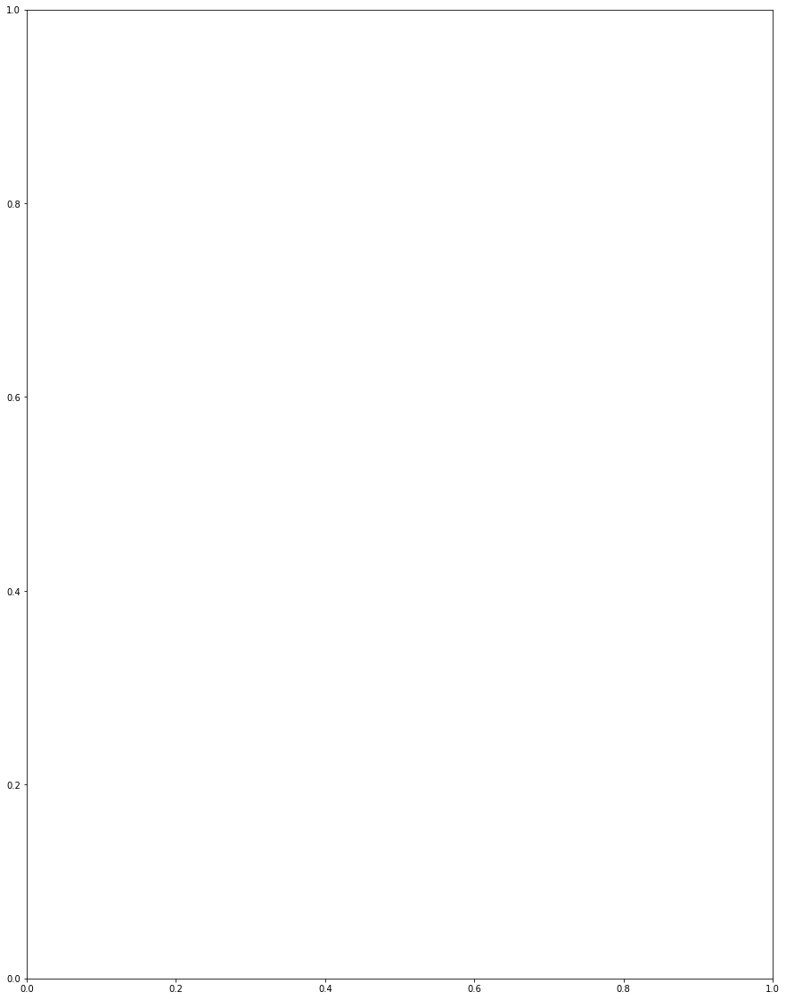

In [82]:
# plot some of the d2 cells
ncells = 10
shuffledIdx = df.loc[d2_SPN_PH3_indexes].index.values.copy()
# shuffle them
np.random.shuffle(shuffledIdx)
shuffledIdx = shuffledIdx[0:ncells]
fig = plt.subplots(sharey=False, figsize=(15,np.ceil(2*ncells)))
for counter, i in enumerate(shuffledIdx):
    CellImage = plot_utils.plotPH3Cell(df.loc[i], df.attrs['datapath'], window=130, lut='plasma')
    plt.subplot(ncells, 1, counter+1)
    plt.grid(False)
    plt.axis('off')
    plt.title(str(i))
    plt.imshow(CellImage)

### Save results

In [104]:
df_out = df.loc[PH3_indexes]
# create new column
df_out['cell_label'] = 'undetermined'
df_out.at[d1_SPN_PH3_indexes, 'cell_label'] = 'd1'
df_out.at[d2_SPN_PH3_indexes, 'cell_label'] = 'd2'
df_out.to_pickle(os.path.join(data_path, animal_to_load + '_ph3_cells.pkl'))

In [101]:
df_out

,AnimalID,ExperimentalCondition,Slide,Slice,Side,AP,ROI,ObjectNumber_cells,I_cell_C2,I_cell_C3,...,ObjectNumber_surround,I_surround_C2,I_surround_C3,I_surround_C4,Center_X,Center_Y,PathName_Channel1,group_name,manual_roi_name,cell_label
288,PH301,A2A-Ai14,1,0,L,Tail,10,289,0.344344,0.591154,...,289,0.342786,0.541136,0.529181,504.359129,1592.107618,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-10,PH301-1-0-L-Tail,undetermined
350,PH301,A2A-Ai14,1,0,L,Tail,10,351,0.234123,0.600202,...,351,0.289082,0.537437,0.560601,1055.873816,1896.187754,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-10,PH301-1-0-L-Tail,undetermined
399,PH301,A2A-Ai14,1,0,L,Tail,10,400,0.186069,0.596318,...,400,0.186633,0.435200,0.364241,1229.779368,2129.884878,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-10,PH301-1-0-L-Tail,undetermined
2731,PH301,A2A-Ai14,1,0,L,Tail,4,309,0.314982,0.501020,...,309,0.337385,0.494712,0.587746,1099.409709,1702.437864,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-4,PH301-1-0-L-Tail,undetermined
3000,PH301,A2A-Ai14,1,0,L,Tail,5,173,0.382195,0.647829,...,173,0.373850,0.563131,0.427618,2161.520285,1042.978963,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-0-L-Tail-5,PH301-1-0-L-Tail,undetermined
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41179,PH301,A2A-Ai14,1,5,L,Tail,19,230,0.263179,0.098114,...,230,0.249527,0.103918,0.618485,664.909707,1280.540068,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-5-L-Tail-19,PH301-1-5-L-Tail,undetermined
43516,PH301,A2A-Ai14,1,5,L,Tail,3,69,0.683830,0.827646,...,69,0.709117,0.712266,0.595794,1310.069144,510.658481,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-5-L-Tail-3,PH301-1-5-L-Tail,undetermined
45193,PH301,A2A-Ai14,1,5,L,Tail,7,305,0.761297,0.232357,...,305,0.683471,0.290302,0.549285,1544.445492,1780.995875,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-5-L-Tail-7,PH301-1-5-L-Tail,d1
45516,PH301,A2A-Ai14,1,5,L,Tail,8,243,0.592078,0.266010,...,243,0.622488,0.354266,0.677110,1208.606211,1501.322762,C:\Users\herny\Desktop\SWC\Data\Microscopy_Dat...,PH301-1-5-L-Tail-8,PH301-1-5-L-Tail,undetermined


### explore data

In [62]:
df.loc[i]

AnimalID                                                             PH301
ExperimentalCondition                                             A2A-Ai14
Slide                                                                    1
Slice                                                                    2
Side                                                                     R
AP                                                                    Tail
ROI                                                                     13
ObjectNumber_cells                                                     169
I_cell_C2                                                         0.703324
I_cell_C3                                                         0.768789
I_cell_C4                                                         0.784116
ObjectNumber_surround                                                  169
I_surround_C2                                                     0.634686
I_surround_C3            

In [ ]:
# Concatenate all the ROIs from one manual slice and show the identified cells

# set the conditions to get the data of one of the ROIs
sel_animal = 'PH301'
sel_slide = '1'
sel_slice = '0'
sel_side = 'L'
sel_ap = 'Tail'

sel_mroi_name = '-'.join([sel_animal, sel_slide, sel_slice, sel_side, sel_ap])

# regenerate the picture from the square ROIs
im = plot_utils.get_concat_image_from_rois(df_raw=df, indexes_to_plot=SPN_indexes, sel_mroi_name=sel_mroi_name,
                                           channel=2, cir_radius=80, binning=10, tdtomato_thr=-1)
im

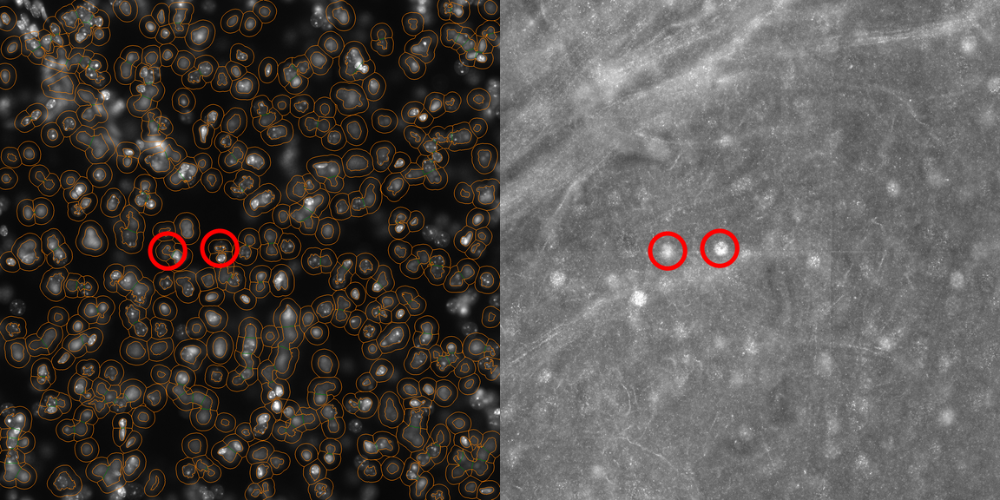

In [17]:
# Circle all cells in a ROI
g_name = 'PH301-1-2-R-Tail-12'
# indicate the size of the circle
cir_radius = 80

im = plot_utils.inspect_cells_in_ROI(df=df, indexes_to_plot=PH3_indexes, g_name=g_name, channels=[4],
                                     cir_radius=cir_radius, binning=4, tdtomato_thr=-1,
                                     plot_cellprofiler=True)
im

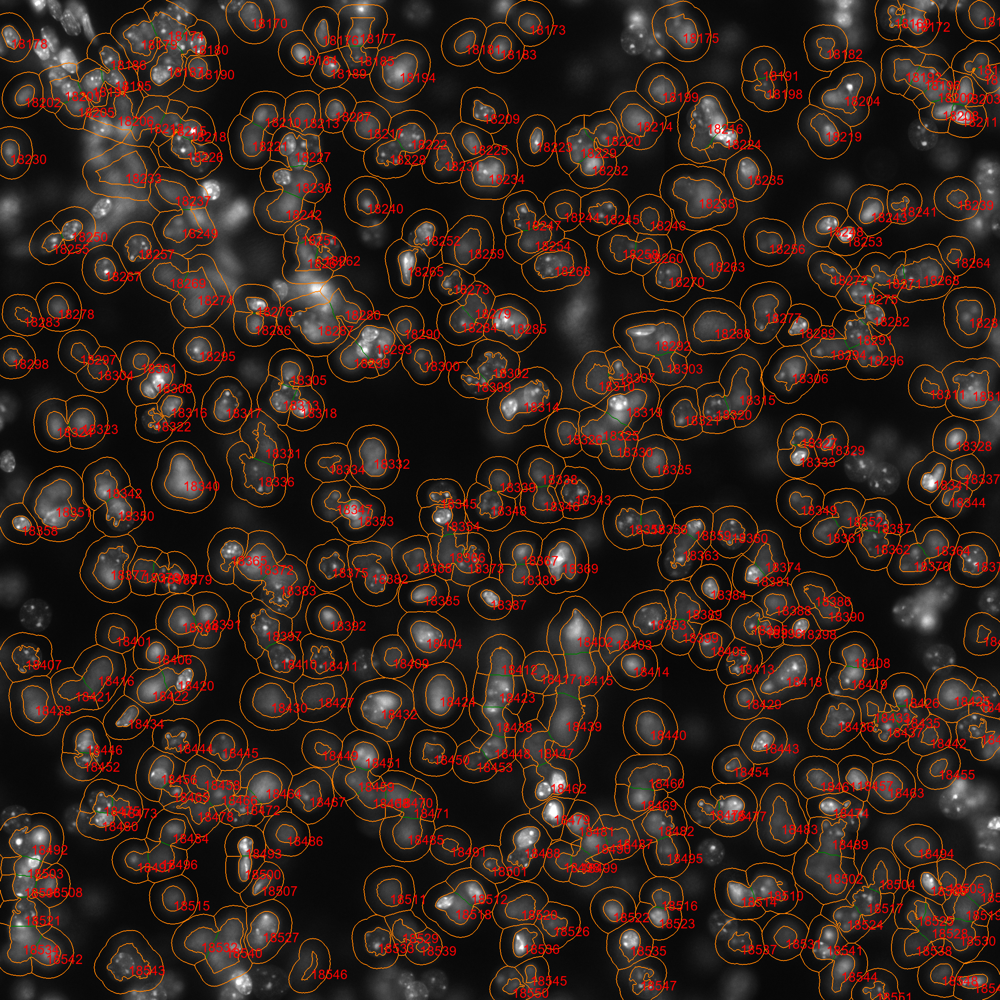

In [18]:
# plot the IDs for every object in a ROI

objects_im = plot_utils.show_object_ids(df, g_name, 30)
objects_im

In [ ]:
CPoutput_path

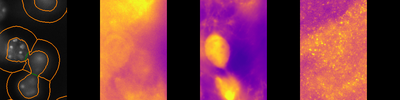

In [71]:
cellid = 5846
plot_utils.plotPH3Cell(df.loc[cellid], df.attrs['datapath'], window=130, lut='plasma')

In [72]:
df.loc[cellid]

AnimalID                                                             PH301
ExperimentalCondition                                             A2A-Ai14
Slide                                                                    1
Slice                                                                    0
Side                                                                     R
AP                                                                    Tail
ROI                                                                     12
ObjectNumber_cells                                                     317
I_cell_C2                                                         0.714854
I_cell_C3                                                         0.801349
I_cell_C4                                                         0.677284
ObjectNumber_surround                                                  317
I_surround_C2                                                     0.721647
I_surround_C3            

### Dumpster

In [ ]:
nd2 = sum(df.loc[spn_plus_ph3_idx].MeanI_C3 >= tdtomato_thr)
nd1 = sum(df.loc[spn_plus_ph3_idx].MeanI_C3 < tdtomato_thr)
ax = plt.pie([nd1, nd2], labels=['d1', 'd2'], colors=['cyan', 'red'],
             autopct='%1.1f%%', shadow=False, startangle=90)

In [ ]:
# find which cells are SPNs. Explore the threshold
sc = 'I_cell_C2'
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((0, .2), (.2, .4), (.4, .6), (.6, .8), (.8, 1))
#create an empty list
indexes = []
# get the indexes of these cohorts
for tr in thresholds:
    shuffledIdx = df[np.logical_and(df[sc]>=tr[0], df[sc]<tr[1])].index.values.copy()
    # shuffle them
    np.random.shuffle(shuffledIdx)
    # append first
    indexes.append(shuffledIdx[0])
fig = plt.subplots(sharey=False, figsize=(15,np.ceil(2*len(thresholds))))
for counter, i in enumerate(indexes):
    CellImage = plot_utils.plotPH3Cell(df.loc[i], CPoutput_path, window=130, lut='plasma')
    plt.subplot(len(thresholds), 1, counter+1)
    plt.grid(False)
    plt.axis('off')
    plt.title(str(thresholds[counter]) + " - " + str(i))
    plt.imshow(CellImage)

In [ ]:
# circle a cell within its original image
# indicate the index of the cell
index_of_cell = spn_plus_ph3_idx[1]
# indicate the size of the circle
cir_radius = 80

imdir = os.path.join(df.attrs['datapath'],
                     'ROIs--Gce_processed',
                     gf.make_image_name_from_series(df.loc[index_of_cell], channel=4))
# find coordinates of cells
c_x = df.loc[index_of_cell].Center_X
c_y = df.loc[index_of_cell].Center_Y
# define coordinates of circle
cir_coord = (c_x - cir_radius, c_y - cir_radius, c_x + cir_radius, c_y + cir_radius)

im = Image.open(imdir)
im = im.convert('RGB')
#draw = ImageDraw.Draw(im)
plot_utils.draw_ellipse(im, cir_coord, outline ='red', width=20)
im

In [ ]:
# Plot slice for registration. this is very low res

# set the conditions to get the data of one of the ROIs
sel_animal = 'PH301'
sel_slide = '1'
sel_slice = '5'
sel_side = 'R'
conditions = np.logical_and(np.logical_and(df.AnimalID == sel_animal, df.Slide == sel_slide),
                            df.Slice == sel_slice)
# plot the slice for registration
img16 = plot_utils.get_reg_image(df[conditions])
img8 = (np.array(img16)/256).astype('uint8')
img8 = img8/np.max(img8)
im = Image.fromarray(np.uint8(img8*255))
im = ImageOps.autocontrast(im, cutoff=.01)
im
# crop it to the manual ROI

# plot the circles

In [ ]:
np.max(im)